In [1]:
# importing the libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import os
import re
import tweepy
import requests
import seaborn as sns
from functools import reduce
from io import StringIO
%matplotlib inline
sns.set_style('dark')
sns.set_palette('Paired')




In [2]:
# To load the twitter-archive file

twitter_archive_df = pd.read_csv('twitter-archive-enhanced.csv')

twitter_archive_df.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [3]:
# To load the image-prediction tsv file

image_prediction_df = pd.read_csv('image-predictions.tsv', sep='\t')
image_prediction_df


,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


In [4]:
# To load the json data into dataframe
# For this I manually downloaded the 'tweet-json.txt' file

json_df = []

# Read data and load into empty list
with open('tweet-json.txt') as json_file:
    for line in json_file: 
        data = json.loads(line)
        tweet_id = data['id']
        retweet_count = data['retweet_count']
        favorite_count = data['favorite_count']
        
        json_df.append({'tweet_id': tweet_id,
                        'retweet_count': int(retweet_count),
                        'favorite_count': int(favorite_count)
        })

    
# Convert the list into dataframe
df_tweet_json = pd.DataFrame(json_df, columns=['tweet_id', 'retweet_count', 'favorite_count'])


# Data Assessment

**Virtual Assessment**

In [5]:
twitter_archive_df.sample(3)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
1247,711652651650457602,NaN,NaN,2016-03-20 20:36:28 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Gary. He just wanted to say hi. 9/10 v...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/711652651...,9,10,Gary,None,None,None,None
2159,669571471778410496,NaN,NaN,2015-11-25 17:40:53 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Keith. He's had 13 DUIs. 7/10 that's t...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/669571471...,7,10,Keith,None,None,None,None
2145,669926384437997569,NaN,NaN,2015-11-26 17:11:11 +0000,"<a href=""http://twitter.com/download/iphone"" r...",I've never seen a dog so genuinely happy about...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/669926384...,12,10,None,None,None,None,None


**Porgrammatic Assessment**

In [6]:
twitter_archive_df.shape

(2356, 17)

In [7]:
twitter_archive_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [8]:
(twitter_archive_df.isna().sum()/len(twitter_archive_df))*100

tweet_id                       0.000000
in_reply_to_status_id         96.689304
in_reply_to_user_id           96.689304
timestamp                      0.000000
source                         0.000000
text                           0.000000
retweeted_status_id           92.317487
retweeted_status_user_id      92.317487
retweeted_status_timestamp    92.317487
expanded_urls                  2.504244
rating_numerator               0.000000
rating_denominator             0.000000
name                           0.000000
doggo                          0.000000
floofer                        0.000000
pupper                         0.000000
puppo                          0.000000
dtype: float64

In [9]:
twitter_archive_df.duplicated().sum()

0

In [10]:
twitter_archive_df.source.unique()

array(['<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>',
       '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'],
      dtype=object)

## Assessing Image prediction dataset

In [11]:
image_prediction_df.shape

(2075, 12)

In [12]:
image_prediction_df.duplicated().sum()

0

In [13]:
image_prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [14]:
image_prediction_df.nunique()

tweet_id    2075
jpg_url     2009
img_num        4
p1           378
p1_conf     2006
p1_dog         2
p2           405
p2_conf     2004
p2_dog         2
p3           408
p3_conf     2006
p3_dog         2
dtype: int64

In [15]:
image_prediction_df.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

## Assessing the tweet-json dataset

In [16]:
df_tweet_json.head()

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048


In [17]:
df_tweet_json.shape

(2354, 3)

In [18]:
df_tweet_json.isnull().sum()

tweet_id          0
retweet_count     0
favorite_count    0
dtype: int64

In [19]:
df_tweet_json.duplicated().sum()

0

In [20]:
df_tweet_json.nunique()

tweet_id          2354
retweet_count     1724
favorite_count    2007
dtype: int64

## Quality Issues

1. Name column in twitter_archive_df dataframe contains some invalid records example "None"

2. The values in column named source in twitter_archive_df should explicitly state the name of the platform the tweet was sent from, this would be replaced from html tag to the source name.

3. Five Columns in twitter_archive_df have more than 70% null values would be dropped, the columns affected are in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id,  retweeted_status_timestamp.  

4. The dog with no stage value in the doggo, floofer, pupper and puppo columns should be explicitly stated as np.nan before merging the columns to a single colmn dog stage.

5. The column tweet_id data type should have proper data type and as such would be change from int to string in all the dataframes.

6. The column timestamp column in the twitter archive dataframe should be converted from object data type to datetime, the columns source and name  in the archive dataframe would be converted from object data type to string.

7. The img_num column in the image prediction dataframe image number that corresponded to the most confident prediction (numbered 1 to 4 since tweets can have up to four images), this would be converted from int to categorical variable.

8. p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, and p3_dog column labels in the image prediction dataframe should have a clear and precise meaning, these labels would be replaced.

9. The df_archive text column contain the main tweet, ratings and the tweet's link which would be split into different columns.





## Tidiness issues
1. There are multiple dog stages columns present i.e. doggo, floofer, pupper and puppo. each observation should form a row, merging the columns to a single dog stage column would solve the issue, lastly the four dog stage columns would be dropped .

2. All the three datasets are part of same observational unit, merging 3 tables into one will done to tidy up the dataset.

# Data Cleaning

In [21]:
# I'd be making copies of all the dataset before cleaning

df_twitter = twitter_archive_df.copy()
df_prediction = image_prediction_df.copy()
df_json = df_tweet_json.copy()

**Quality Issue 1**

In [22]:
# Found these incorrect names on the twitter_archive dataset

incorrect_names = ['Al','Ed','an', 'by', 'my', 'all', 'his', 'mad', 'not', 'old', 'one', 'the', 'all', 'the', 'Stu', 
                   'this', 'quite', 'just', 'such', 'very', 'getting', 'actually', 'Corticalli', 'incredibly', 
                   'infuriating', 'unacceptable', 'None', 'a', '0']

In [23]:
# To get all the data in the name column
names = list (df_twitter['name'].values)

In [24]:
for index, row in df_twitter.iterrows():
    if str(df_twitter.name[index]) in incorrect_names:
        df_twitter.name[index] = 'unknown'
    else: 
        pass

/var/folders/xb/5nhqc36d1fdcmw9fgsfsdsbw0000gn/T/ipykernel_18443/3149391799.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_twitter.name[index] = 'unknown'


In [25]:
assert 'Al' not in df_twitter['name'].values

## Issue 2: The values in column named source in twitter_archive_df should explicitly state the name of the platform the tweet was sent from, this would be replaced from html tag to the source name.

**Solution:**

- Replace each unique source of tweet in html tag with the source explicit name, to do this we apply the map function to replace the key value pairs.

In [26]:
# access each value to be replaced in the column

df_twitter.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

In [27]:
# map function on the column key value pairs

df_twitter.source = df_twitter.source.map({'<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>': 'Twitter for iphone', '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>': 'Vine', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>': 'Twitter Web Client', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>': 'TweetDeck'})



In [28]:
# To test/check the replaced values
df_twitter.source.value_counts()

Twitter for iphone    2221
Vine                    91
Twitter Web Client      33
TweetDeck               11
Name: source, dtype: int64

## Issue 3: Five Columns in twitter_archive_df have more than 70% null values would be dropped

In [29]:
(df_twitter.isna().sum()/len(df_twitter))*100

tweet_id                       0.000000
in_reply_to_status_id         96.689304
in_reply_to_user_id           96.689304
timestamp                      0.000000
source                         0.000000
text                           0.000000
retweeted_status_id           92.317487
retweeted_status_user_id      92.317487
retweeted_status_timestamp    92.317487
expanded_urls                  2.504244
rating_numerator               0.000000
rating_denominator             0.000000
name                           0.000000
doggo                          0.000000
floofer                        0.000000
pupper                         0.000000
puppo                          0.000000
dtype: float64

The columns affected are **in_reply_to_status_id**, **in_reply_to_user_id**, **retweeted_status_id**, **retweeted_status_user_id**, **retweeted_status_timestamp**

In [30]:
# To drop the affected columns

df_twitter.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp'], axis = 1, inplace = True)



In [31]:
# To check if they've been dropped

df_twitter.columns

Index(['tweet_id', 'timestamp', 'source', 'text', 'expanded_urls',
       'rating_numerator', 'rating_denominator', 'name', 'doggo', 'floofer',
       'pupper', 'puppo'],
      dtype='object')

## Issue 4: The dog with no stage value in the doggo, floofer, pupper and puppo columns should be explicitly stated as np.nan before merging the columns to a single colmn dog stage.


- There are dogs with no stage name, these were named none and it would be replaced with np.nan in the doggo, floofer, pupper and puppo columns

In [32]:
# Function to replace None with np.nan in doggo, floofer, pupper and puppo columns

def replace_value(column):
    """replace None values with Unidentified"""
    """param: column"""
    """return replaced value"""
    replaced_value = column.replace([None], np.nan, inplace=True)
    return replaced_value

In [33]:
# Replacing the None in doggo, floofer, pupper and puppo

replace_value(df_twitter.puppo)
replace_value(df_twitter.doggo)
replace_value(df_twitter.floofer)
replace_value(df_twitter.pupper)


In [34]:
# Test to access the replace value
df_twitter.puppo.value_counts()

None     2326
puppo      30
Name: puppo, dtype: int64

## Issue 5: The column tweet_id data type should have proper data type and as such would be change from int to string in all the dataframes

In [35]:
# check the data type in the twitter-archive dataset
df_twitter.tweet_id.dtype

dtype('int64')

In [36]:
# check the data type in the tweet-json dataset
df_json.tweet_id.dtype

dtype('int64')

In [37]:
# check the data type in the image-prediction dataset
df_prediction.tweet_id.dtype

dtype('int64')

In [38]:
# convert the required column to each data type
df_twitter['tweet_id'] = df_twitter['tweet_id'].astype('string')
df_json['tweet_id'] = df_json['tweet_id'].astype('string')
df_prediction['tweet_id'] = df_prediction['tweet_id'].astype('string')


**Test**

In [39]:
# To check the updated data type
df_twitter.tweet_id.dtype

string[python]

In [40]:
# To check the updated data type
df_prediction.tweet_id.dtype

string[python]

## Issue 6: The column timestamp column in the twitter archive dataframe should be converted from object data type to datetime, the columns source and name  in the archive dataframe would be converted from object data type to string.

In [41]:
# To check the data type in the twitter-archive dataset
df_twitter.timestamp.dtype

dtype('O')

In [42]:
# To check the data type
df_twitter.source.dtype

dtype('O')

In [43]:
# To check the data type
df_twitter.name.dtype

dtype('O')

In [44]:
df_twitter['timestamp'] = pd.to_datetime(df_twitter['timestamp'])
df_twitter['source'] = df_twitter['source'].astype('string')
df_twitter['name'] = df_twitter['name'].astype('string')

**Tests**

In [45]:
# To check the updated data type
df_twitter.timestamp.dtype

datetime64[ns, UTC]

In [46]:
# To check the updated data type
df_twitter.source.dtype

string[python]

In [47]:
df_twitter.name.dtype

string[python]

## Issue 7: The img_num column in the image prediction dataframe image number that corresponded to the most confident prediction (numbered 1 to 4 since tweets can have up to four images), this would be converted from int to categorical variable.

In [48]:
# To check the data type of the img_num in the image prediction dataset
df_prediction.img_num.dtype

dtype('int64')

In [49]:
# To convert the column to categorical

df_prediction.img_num = df_prediction.img_num.astype('category')


In [50]:
# Result
df_prediction.img_num.dtype

CategoricalDtype(categories=[1, 2, 3, 4], ordered=False)

## Issue 8: p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, and p3_dog column labels in the image prediction dataframe should have a clear and precise meaning, these labels would be replaced.

- To have a clear label and better understand the column label in image prediction dataframe would be change with replace column function

In [51]:
# Would be renaming the column
df_prediction.rename(columns = {'p1': 'pred1', 'p2': 'pred2', 'p3': 'pred3', 'p1_conf': 'pred1_conf%', 'p2_conf': 'pred2_conf%', 'p3_conf': 'pred3_conf%', 'p1_dog': 'pred1_a_dog', 'img_num': 'frame_number', 'p2_dog': 'pred2_a_dog', 'p3_dog': 'pred3_a_dog'}, inplace = True)


**Tests**

In [52]:
# To check the columns
df_prediction.columns

Index(['tweet_id', 'jpg_url', 'frame_number', 'pred1', 'pred1_conf%',
       'pred1_a_dog', 'pred2', 'pred2_conf%', 'pred2_a_dog', 'pred3',
       'pred3_conf%', 'pred3_a_dog'],
      dtype='object')

## Issue 9: The df_archive text column contain the main tweet, ratings and the tweet's link which would be split into different columns.



#### Define 

- Covert the text column to string before extracting the strings in the text column into new columns that has the ratings, tweet's link, and the content of the tweet, dropping the text column would be inperative.

In [53]:
# convert to string
df_twitter['text'] = df_twitter['text'].astype('string')

# new column with extracted tweet_link of text column
df_twitter['tweet_link'] = df_twitter['text'].str.extract('(https?:\/\/(?:www\.)?[-a-zA-Z0-9@:%._+~#=]{1,256}\.[a-zA-Z0-9()]{1,6}[-a-zA-Z0-9()@:%_+.~#?&/=]*)')


In [54]:
# new column with extract fraction from text 
df_twitter['ratings'] = df_twitter['text'].str.extract("((\d*?)[-]*(\d+)\s*/\s*(\d+))").iloc[:, 0]


In [55]:
# lambda func on the text column
# to split tweet_link off
df_twitter["tweet"]  = df_twitter['text'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])

# lambda func on the text column to split fraction off
df_twitter["tweet"]  = df_twitter['text'].apply(lambda x: re.split('((\d*?)[-]*(\d+)\s*/\s*(\d+))', str(x))[0])


In [56]:
# drop the text column
df_twitter.drop('text', axis = 1, inplace = True)

In [57]:
# check extracted tweet_link
df_twitter['tweet_link']

0       https://t.co/MgUWQ76dJU
1       https://t.co/0Xxu71qeIV
2       https://t.co/wUnZnhtVJB
3       https://t.co/tD36da7qLQ
4       https://t.co/AtUZn91f7f
                 ...           
2351    https://t.co/4B7cOc1EDq
2352    https://t.co/DWnyCjf2mx
2353    https://t.co/y671yMhoiR
2354    https://t.co/r7mOb2m0UI
2355    https://t.co/BLDqew2Ijj
Name: tweet_link, Length: 2356, dtype: object

In [58]:
# check extracted ratings column
df_twitter['ratings'].value_counts()

12/10      558
11/10      463
10/10      461
13/10      351
9/10       156
8/10       102
14/10       54
7/10        53
5/10        36
6/10        32
3/10        19
4/10        15
2/10         9
1/10         8
15/10        2
4/20         2
420/10       2
9/11         2
0/10         2
75/10        2
99/90        1
17/10        1
666/10       1
182/10       1
960/00       1
11/15        1
007/10       1
84/70        1
24/7         1
165/150      1
1776/10      1
204/170      1
50/50        1
20/16        1
27/10        1
45/50        1
-5/10        1
88/80        1
144/120      1
26/10        1
80/80        1
7/11         1
121/110      1
44/40        1
60/50        1
143/130      1
1/2          1
Name: ratings, dtype: Int64

In [59]:
# check extracted tweet content
df_twitter['tweet'].value_counts() 

                                                                                                                  13
🎶 HELLO FROM THE OTHER SIIIIIIIIDE 🎶                                                                               2
Say hello to Blakely. He thinks that's a hat. Silly pupper. That's a nanner.                                       1
This is Lizzie. She's about to fist bump the large ridable maned pupper. She's very excited.                       1
Please send dogs. I'm tired of seeing other stuff like this dangerous pirate. We only rate dogs. Thank you...      1
                                                                                                                  ..
This is Finley. He's an independent doggo still adjusting to life on his own.                                      1
This is Maximus. A little rain won't stop him. He will persevere.                                                  1
RT @dog_rates: After so many requests, this is Bretagne. She was

In [60]:
# check the dataframe
df_twitter.head()

,tweet_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,tweet_link,ratings,tweet
0,892420643555336193,2017-08-01 16:23:56+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None,https://t.co/MgUWQ76dJU,13/10,This is Phineas. He's a mystical boy. Only eve...
1,892177421306343426,2017-08-01 00:17:27+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None,https://t.co/0Xxu71qeIV,13/10,This is Tilly. She's just checking pup on you....
2,891815181378084864,2017-07-31 00:18:03+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None,https://t.co/wUnZnhtVJB,12/10,This is Archie. He is a rare Norwegian Pouncin...
3,891689557279858688,2017-07-30 15:58:51+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None,https://t.co/tD36da7qLQ,13/10,This is Darla. She commenced a snooze mid meal.
4,891327558926688256,2017-07-29 16:00:24+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None,https://t.co/AtUZn91f7f,12/10,This is Franklin. He would like you to stop ca...


## Tidiness Issues

### Issue 1: There are multiple dog stages columns present i.e. doggo, floofer, pupper and puppo. each observation should form a row, merging the columns to a single dog stage column would solve the issue.


- Combining the various stages of dogs to a single column in the twitter archive dataframe, renaming the combined values and finally dropping the four columns of the dog stage.


In [61]:
# To concat the doggo dog stage to one column "dog_stage"

df_twitter["dog_stage"] = df_twitter['doggo'].astype(str) + "-" + df_twitter["floofer"].astype(str) + "-" + df_twitter["pupper"].astype(str) + "-" + df_twitter["puppo"].astype(str)



In [62]:
# To check the values of dog_stage column
df_twitter.dog_stage.value_counts()

None-None-None-None        1976
None-None-pupper-None       245
doggo-None-None-None         83
None-None-None-puppo         29
doggo-None-pupper-None       12
None-floofer-None-None        9
doggo-None-None-puppo         1
doggo-floofer-None-None       1
Name: dog_stage, dtype: int64

In [63]:
# rename values in dog_stage column
df_twitter.dog_stage = df_twitter.dog_stage.replace({'None-None-None-None':'Anonymous',
                                                             'None-None-pupper-None':'pupper', 
                                                             'doggo-None-None-None':'doggo',
                                                             'None-None-None-puppo':'puppo', 
                                                             'doggo-None-pupper-None':'doggo and pupper',
                                                             'None-floofer-None-None': 'floofer', 
                                                             'doggo-None-None-puppo':'doggo and puppo',
                                                             'doggo-floofer-None-None': 'doggo and floofer'})

In [64]:
# To check the repalced value
df_twitter.dog_stage.value_counts()

Anonymous            1976
pupper                245
doggo                  83
puppo                  29
doggo and pupper       12
floofer                 9
doggo and puppo         1
doggo and floofer       1
Name: dog_stage, dtype: int64

In [65]:
# drop the four columns of dog stage
df_twitter.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis = 1, inplace = True)

In [66]:
# To check the results
list(df_twitter)

['tweet_id',
 'timestamp',
 'source',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'tweet_link',
 'ratings',
 'tweet',
 'dog_stage']

### Issue 2 : All the three datasets are part of same observational unit.  merging 3 tables into one will done to tidy up the dataset.

In [67]:
# merging the three dataframe
#define list of DataFrames
dataframes = [df_twitter, df_prediction, df_json]

#merge all DataFrames into one
twitter_archive_master = reduce(lambda  left,right: pd.merge(left,right,on=['tweet_id'], how='inner'), dataframes)

In [68]:
twitter_archive_master.head()

,tweet_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,tweet_link,ratings,tweet,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,retweet_count,favorite_count
0,892420643555336193,2017-08-01 16:23:56+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,https://t.co/MgUWQ76dJU,13/10,This is Phineas. He's a mystical boy. Only eve...,...,0.097049,False,bagel,0.085851,False,banana,0.076110,False,8853,39467
1,892177421306343426,2017-08-01 00:17:27+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,https://t.co/0Xxu71qeIV,13/10,This is Tilly. She's just checking pup on you....,...,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,6514,33819
2,891815181378084864,2017-07-31 00:18:03+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,https://t.co/wUnZnhtVJB,12/10,This is Archie. He is a rare Norwegian Pouncin...,...,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,4328,25461
3,891689557279858688,2017-07-30 15:58:51+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,https://t.co/tD36da7qLQ,13/10,This is Darla. She commenced a snooze mid meal.,...,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,8964,42908
4,891327558926688256,2017-07-29 16:00:24+00:00,Twitter for iphone,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,https://t.co/AtUZn91f7f,12/10,This is Franklin. He would like you to stop ca...,...,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,9774,41048


In [69]:
# save as a csv file
twitter_archive_master.to_csv('twitter_archive_master.csv')

# Ananlyzing and Visualizing Data

### In this section analysis and visualization of the wrangled data would be carried out, this consist of exploratory and explanatory analysis.

## To check the distribution of dog stage, a function is defined below to access each dog's stage in the gathered tweets. 

In [70]:
# I'll be writing a function to plot a countplot

def count_plot(x, title):
    """plot a countplot of one variable"""
    """param:x, title"""
    """return none"""
    fig = plt.figure(figsize=(8,6), dpi= 400)
    ax =sns.countplot(x = x , data =twitter_archive_master)
    for p in ax.patches:
      ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0, p.get_height()+0.05))
    title = fig.suptitle(title)
    plt.xticks(rotation = 45)
    plt.plot()   
plt.show();

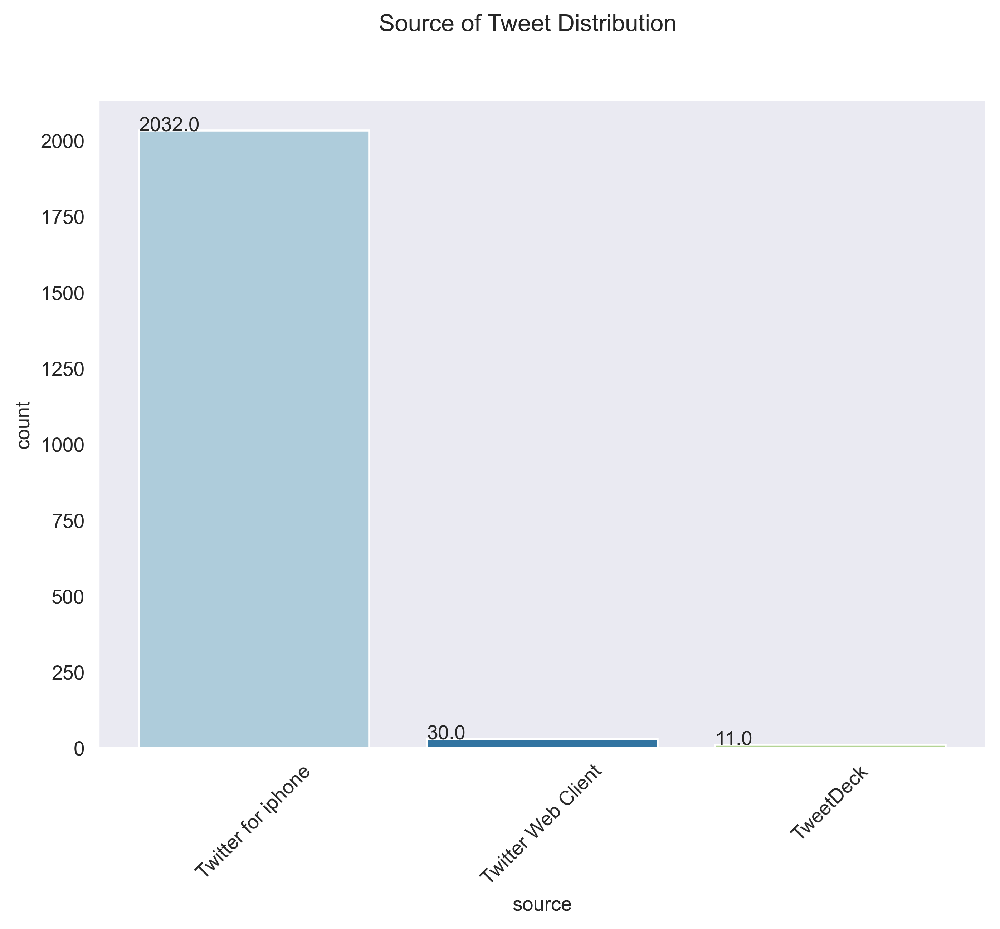

In [71]:
# call func to plot freq of source of tweet
count_plot('source', 'Source of Tweet Distribution')

**The figure above indicates that majority of the tweets are sent from Twitter for iphone with an occurence of 2032, representing 99% of the category of source of tweet.**

## A scattered graph indicating the correlation between the retweet count and favorite count. 

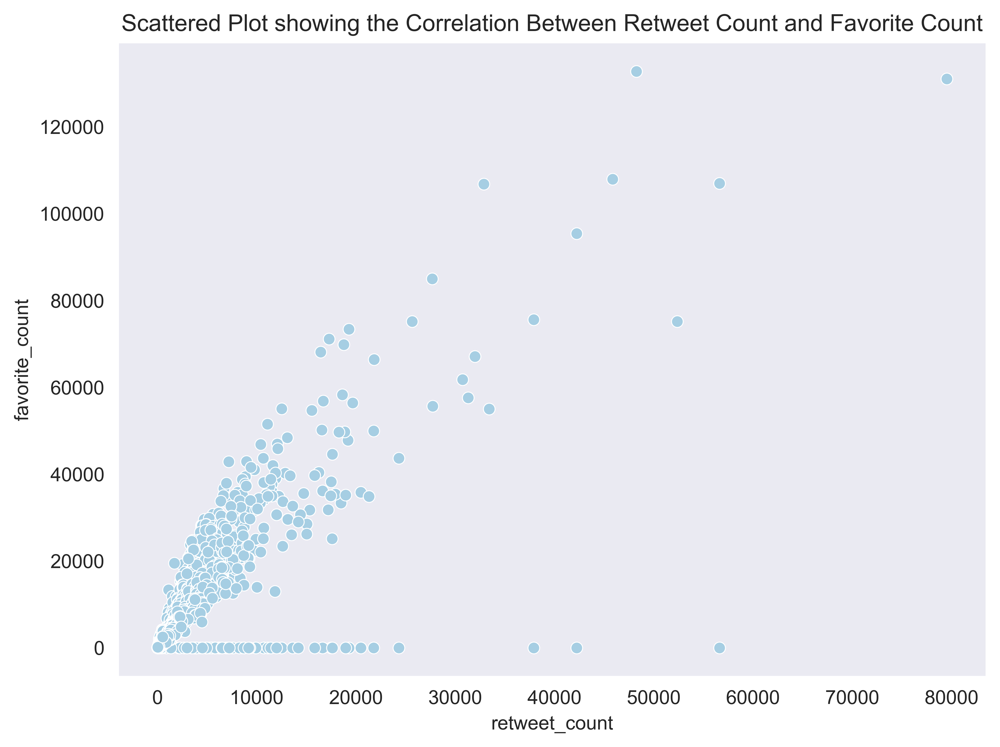

In [72]:
# plot a scattered graph
fig, ax = plt.subplots(figsize =(8,6), dpi =600)
p = sns.scatterplot(x= 'retweet_count', y = 'favorite_count', data =  twitter_archive_master,)
p.set(title = 'Scattered Plot showing the Correlation Between Retweet Count and Favorite Count')
plt.savefig("scatteredplot.png", format="png")


**The figure above highlights the correlation between the retweet count and favorite count, in this case a positive correction**


In [73]:
# func to plot a scatter plot
def draw_scatter_plot(hue, title):
    """plot a scatter plot"""
    """param: hue, title"""
    """return none"""
    ax = plt.figure(figsize =(8,6), dpi =600)
    p =sns.scatterplot(x= 'retweet_count', y = 'favorite_count', data =  twitter_archive_master, hue = hue)
    p.set(title = title)
    p.set(xscale = 'log')
    p.set(yscale = 'log')
    plt.savefig("scatterplot.png", format="png")

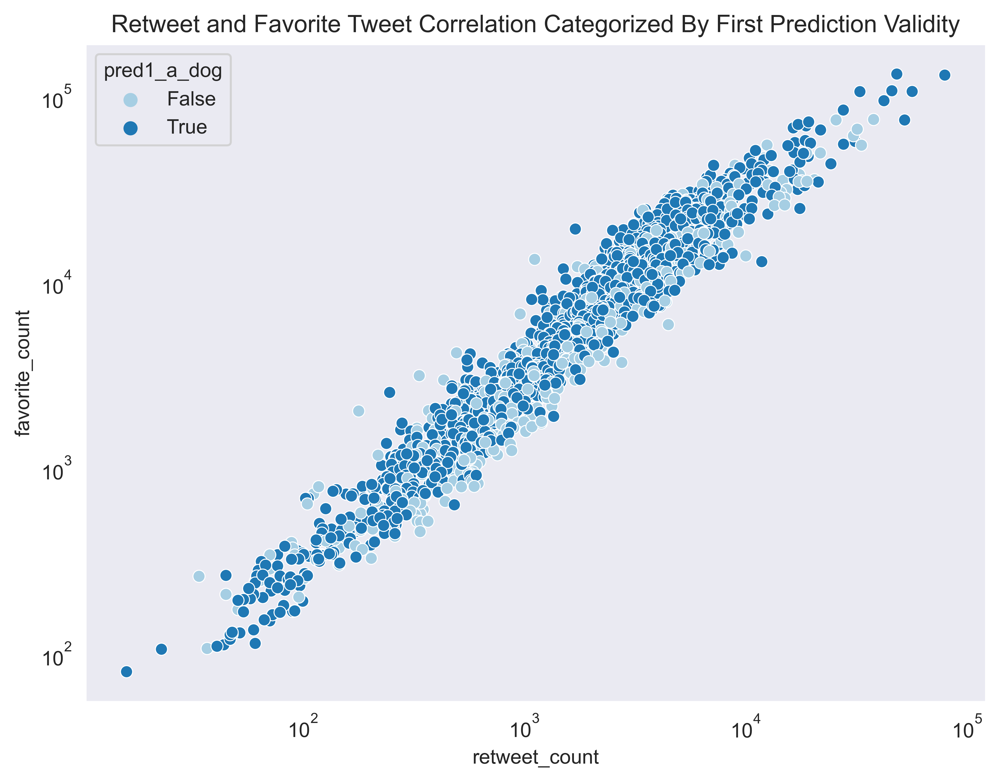

In [74]:
# call func to plot Corr btw Retweet and favorite 
# tweet categorize by validity of first prediction 
draw_scatter_plot('pred1_a_dog', 'Retweet and Favorite Tweet Correlation Categorized By First Prediction Validity')

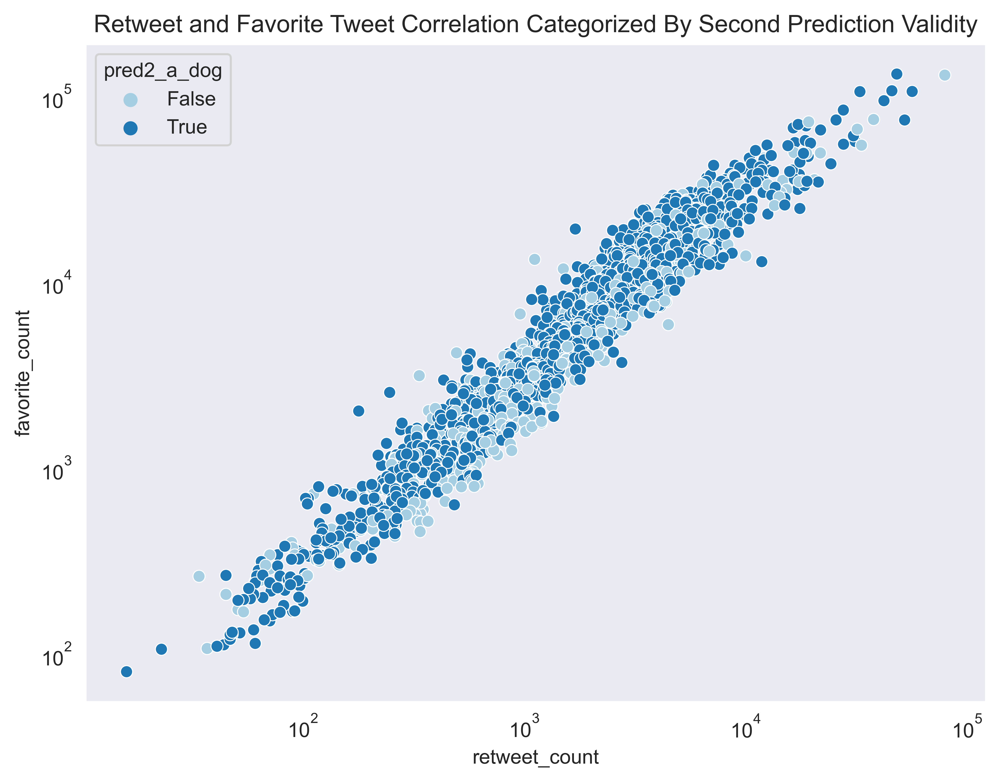

In [75]:
# call func to plot Corr btw Retweet and favorite 
# tweet categorize by validity of second prediction 
draw_scatter_plot('pred2_a_dog',  'Retweet and Favorite Tweet Correlation Categorized By Second Prediction Validity')


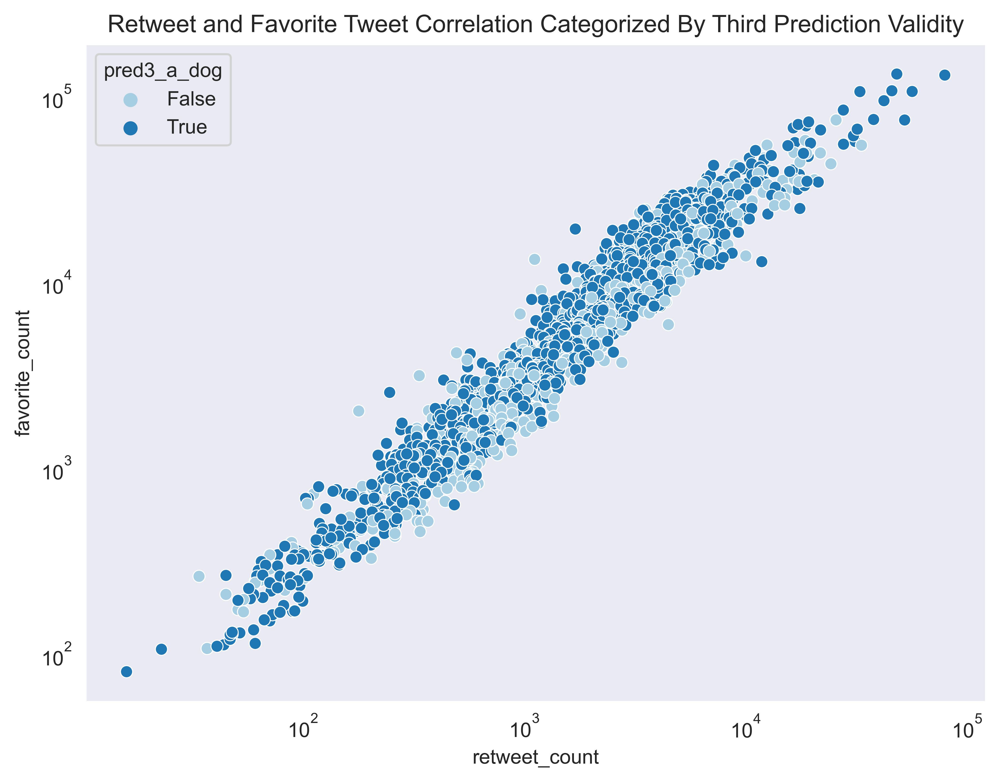

In [76]:
# call func to plot Corr btw Retweet and favorite 
# tweet categorize by validity of third prediction 
draw_scatter_plot('pred3_a_dog', 'Retweet and Favorite Tweet Correlation Categorized By Third Prediction Validity')

**The correlation between the retweet count and favorite count is positive, it's quite logical the more a tweet get retweeted the tendency to reach more audience for potential likes, data points are represented categorically by the validity of the third prediction, the correct prediction as true and wrong prediction as false. In this third predictions scenario we can figure out each data points of whether the prediction was a dog or not.** 


>***In the image prediction dataframe there are predictions that were not dogs in all the three predictions, we can decide to assess the predictions that were dog only. it would be logical to filter out the image prediction that predicted something else other than a dog, consequently a word cloud would be appropriate to display the predicted dog breed in word cloud.***



In [77]:
# filter out wrong prediction for first second & third predictions
logical_dog_pred = twitter_archive_master[(twitter_archive_master.pred1_a_dog== True) & (twitter_archive_master.pred2_a_dog== True)& (twitter_archive_master.pred3_a_dog)]



In [78]:
# check the pred1 for wrong prediction
logical_dog_pred.query('pred1_a_dog == False')

,tweet_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,tweet_link,ratings,tweet,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,retweet_count,favorite_count


In [79]:
logical_dog_pred.query('pred2_a_dog == False')

,tweet_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,tweet_link,ratings,tweet,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,retweet_count,favorite_count


In [80]:
logical_dog_pred.query('pred3_a_dog == False')

,tweet_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,tweet_link,ratings,tweet,...,pred1_conf%,pred1_a_dog,pred2,pred2_conf%,pred2_a_dog,pred3,pred3_conf%,pred3_a_dog,retweet_count,favorite_count


In [81]:
# install wordcloud
! pip install wordcloud

In [82]:
# import wordcloud
from wordcloud import WordCloud

In [83]:
# each item in pred1, pred2 & pred3 column as text to be generated
text_pred1 = " ".join(i for i in logical_dog_pred['pred1'])
text_pred2 = " ".join(i for i in logical_dog_pred['pred2'])
text_pred3 = " ".join(i for i in logical_dog_pred['pred3'])

In [84]:
# each pred wordcould title
title_pred1 = 'First Prediction Word Cloud'
title_pred2 = 'Second Prediction Word Cloud'
title_pred3 = 'Third Prediction Word Cloud'

In [85]:
# plot a func to plot wordcloud for preditions
def draw_word_cloud(text, title):
    """Plot a word cloud of Dog Predictions"""
    """param: text, title"""
    """return none"""
    wordcloud = WordCloud(background_color="white", max_font_size=300, width=1024, height=1000, colormap="magma").generate_from_text(text)
    plt.figure(figsize=(20,20))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.margins(x=0, y=0)
    plt.suptitle(title, fontsize=30)
    plt.savefig("wordcloud.png", format="png")
    plt.show()
    
    

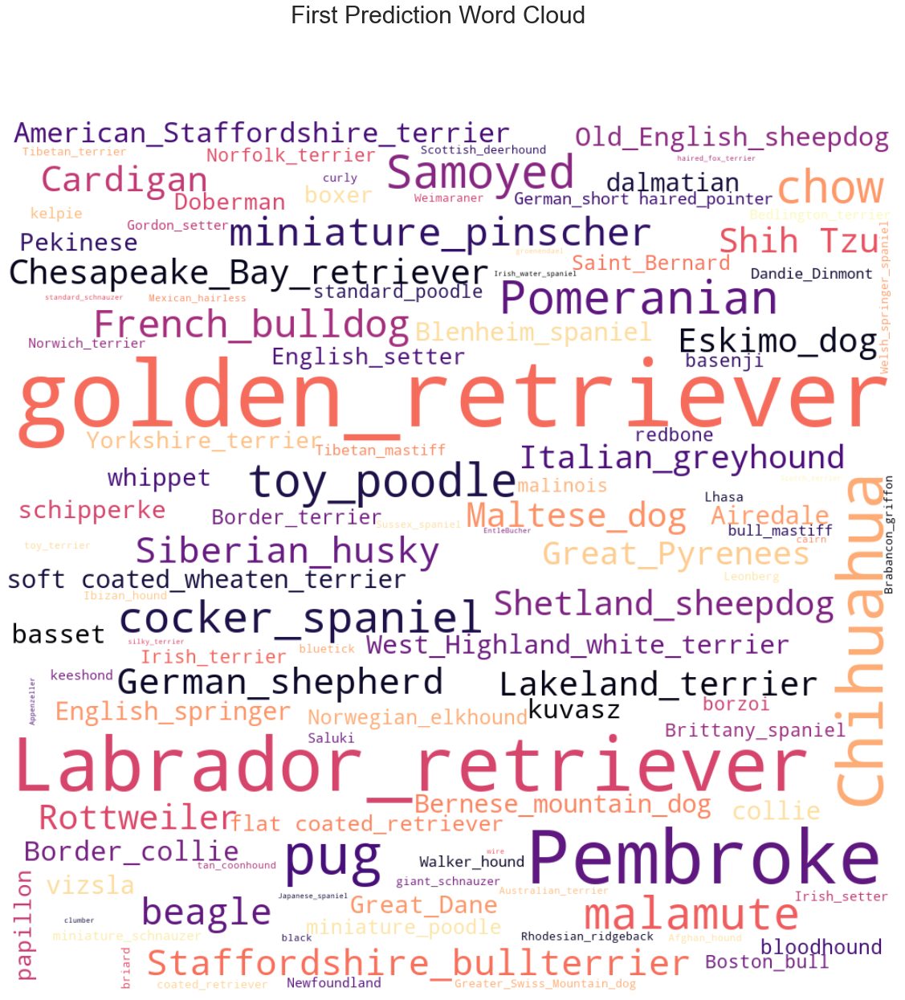

In [86]:
# call func to plot wordcloud for  first prediction 
draw_word_cloud(text_pred1, title_pred1)

**The word cloud of the first prediction of breed of dogs is plotted above, from this figure above Labrador retriver and golden retriever has the highest number of predictions with every other dogs represented with their names.**



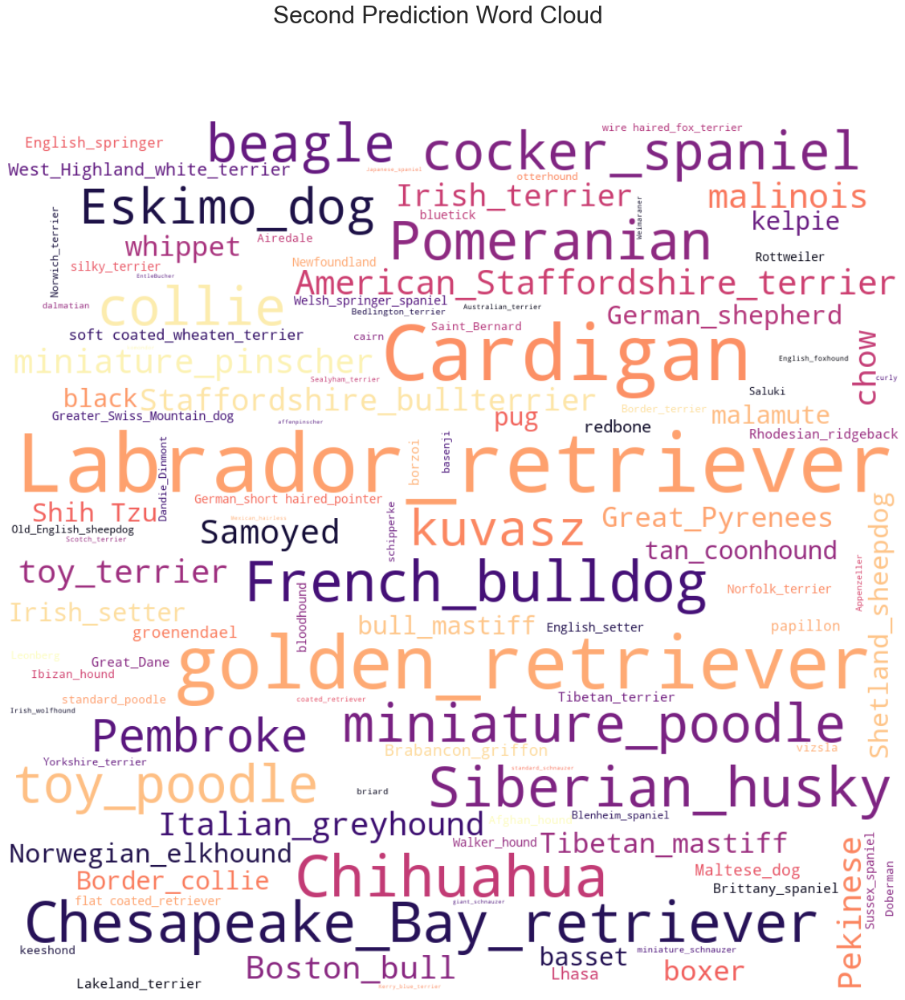

In [87]:
# call func to plot wordcloud for first prediction 
draw_word_cloud(text_pred2, title_pred2)


**The word cloud of the first prediction of breed of dogs is plotted above, from this figure above Labrador retriver and golden retriever has the highest number of predictions with every other dogs represented with their names.**



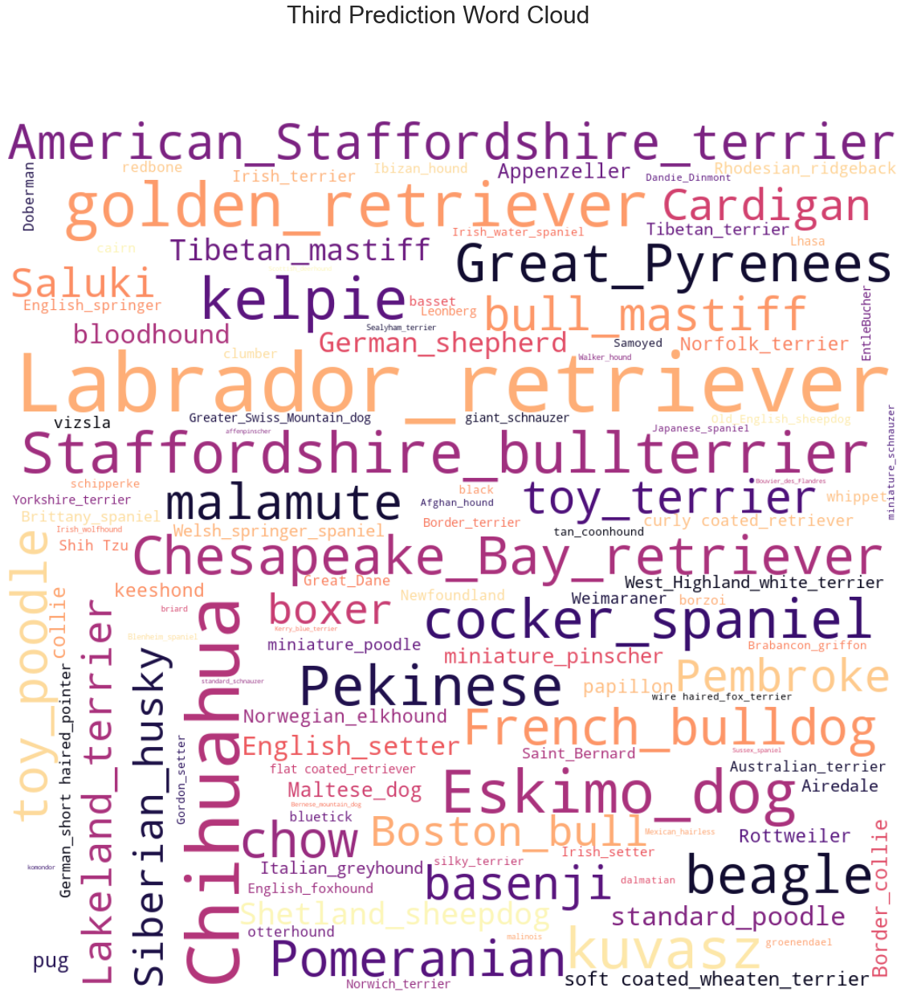

In [88]:
# call func to plot wordcloud for first prediction 
draw_word_cloud(text_pred3, title_pred3)


**The word cloud of the first prediction of breed of dogs is plotted above, from this figure above Labrador retriver and golden retriever has the highest number of predictions with every other dogs represented with their names.**



### Predicted images are presented in url from the image prediction dataframe, to have a better understanding of the prediction, it was decided to pass a random url as a request and writing the response file on the local machine, the written file would be displayed with matplotlib image.  



In [89]:
# check the img pred url
logical_dog_pred.jpg_url

1       https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg
2       https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg
4       https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg
7       https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg
8       https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg
                             ...                       
2068    https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg
2069    https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg
2070    https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg
2071    https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg
2072    https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg
Name: jpg_url, Length: 1242, dtype: object

In [90]:
# create variable name for url in index 10
image_pred10 = logical_dog_pred.jpg_url[10]

In [91]:
# import img from matplotlib
from matplotlib import image as img

In [92]:
# func to disply img from a url
def draw_img_frm_url(url):
    """requires internet access"""
    """write image from url to 
    local machine as img_pred file"""    
    """use matplotlib image to plot the
    image file"""    
    """param: url"""
    """return none"""
    image_file = open('img_pred','wb')
    image_file.write(requests.get(url).content)
    image_file.close()
    plt.figure(figsize=(16,16))
    plt.title('Image Prediction', fontsize = 15)  
    image = img.imread('img_pred')
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)
    plt.savefig("dog_sample.png", format="png")
    plt.show()

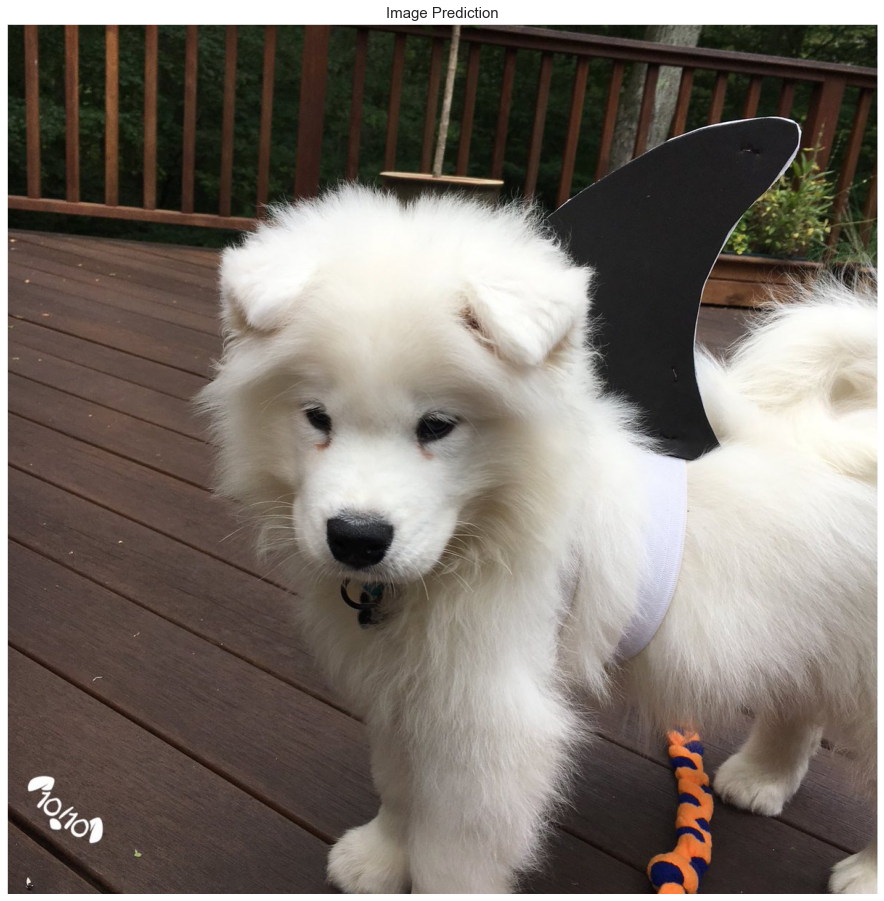

In [93]:
# calling func to plot predicted
# image in index 9
draw_img_frm_url(image_pred10)

In [94]:
# Display content of tweet dog predicted
logical_dog_pred.tweet[10]

'This is Koda. He is a South Australian deckshark. Deceptively deadly. Frighteningly majestic. '

In [96]:
logical_dog_pred.jpg_url[920]

'https://pbs.twimg.com/media/Ciqq-VFUUAANlWm.jpg'

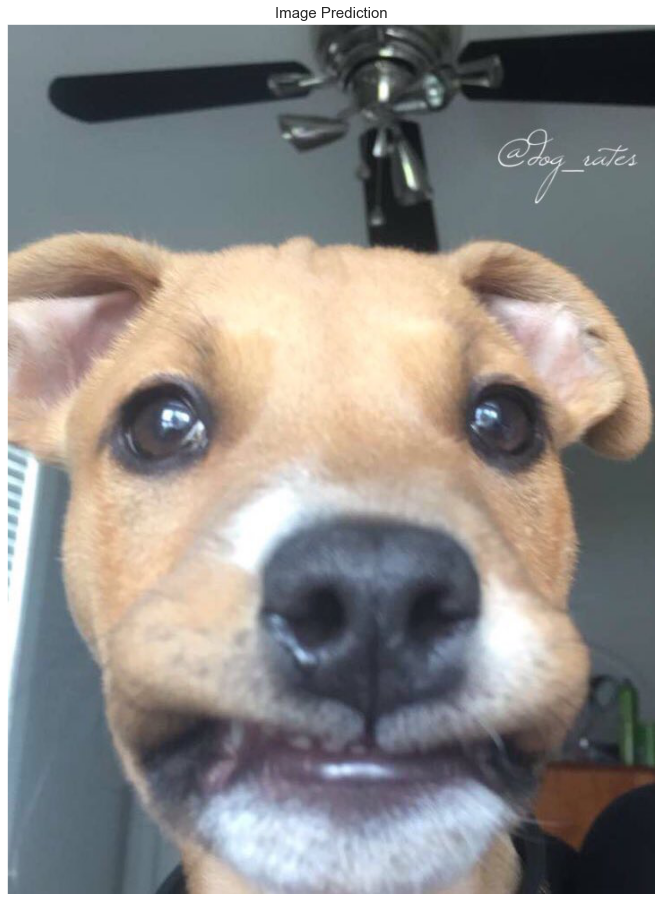

In [97]:
draw_img_frm_url(logical_dog_pred.jpg_url[920])

In [99]:
logical_dog_pred.tweet[920]

'When your teacher agreed on 10,000 RTs and no final but after 24 hours you only have 37... '

**The image predictions were good, as a result of the sample gotten above, we can confirm this with the tweet that was archived in the twitter archive dataframe. For prediction in index number 10 we have the tweet as "This is Koda. He is a South Australian deckshark. Deceptively deadly. Frighteningly majestic.", and for prediction in index number 920 we have the tweet as  "When your teacher agreed on 10,000 RTs and no final but after 24 hours you only have 37..."** 



### Insights:
1. The majority of the tweets are sent from Twitter for iphone with an occurence of 2032, representing 98% of the category of source of tweet.

2. The relationship between the retweet count and favorite count is a positive correction from all indications, it make sense as the more a tweet get retweeted the tendency to reach more audience for potential likes. 

3. The word clouds in all the numbers of predictions of dogs indicate Labrador retriver, golden retriever, chihuahua and pembroke are among the highest number of predictions with every other predicted dogs represented with their breeds in the word clouds.

4. The image predictions were good, as a result of the sample gotten above, we can confirm this with the tweet that was archived in the twitter archive dataframe. For prediction in index number 10 we have the tweet as "This is Koda. He is a South Australian deckshark. Deceptively deadly. Frighteningly majestic.", and for prediction in index number 920 we have the tweet as  "When your teacher agreed on 10,000 RTs and no final but after 24 hours you only have 37..."


## Visualization

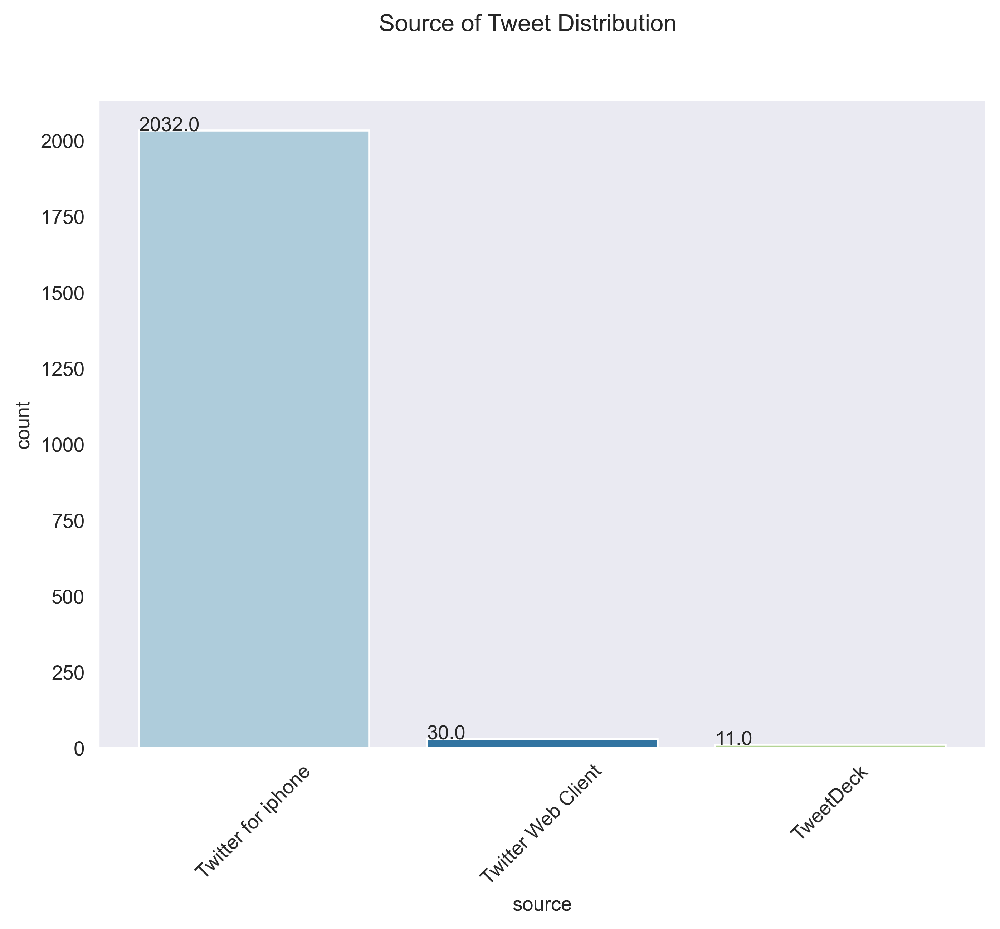

In [104]:
# call func to plot freq of source of tweet
count_plot('source', 'Source of Tweet Distribution')

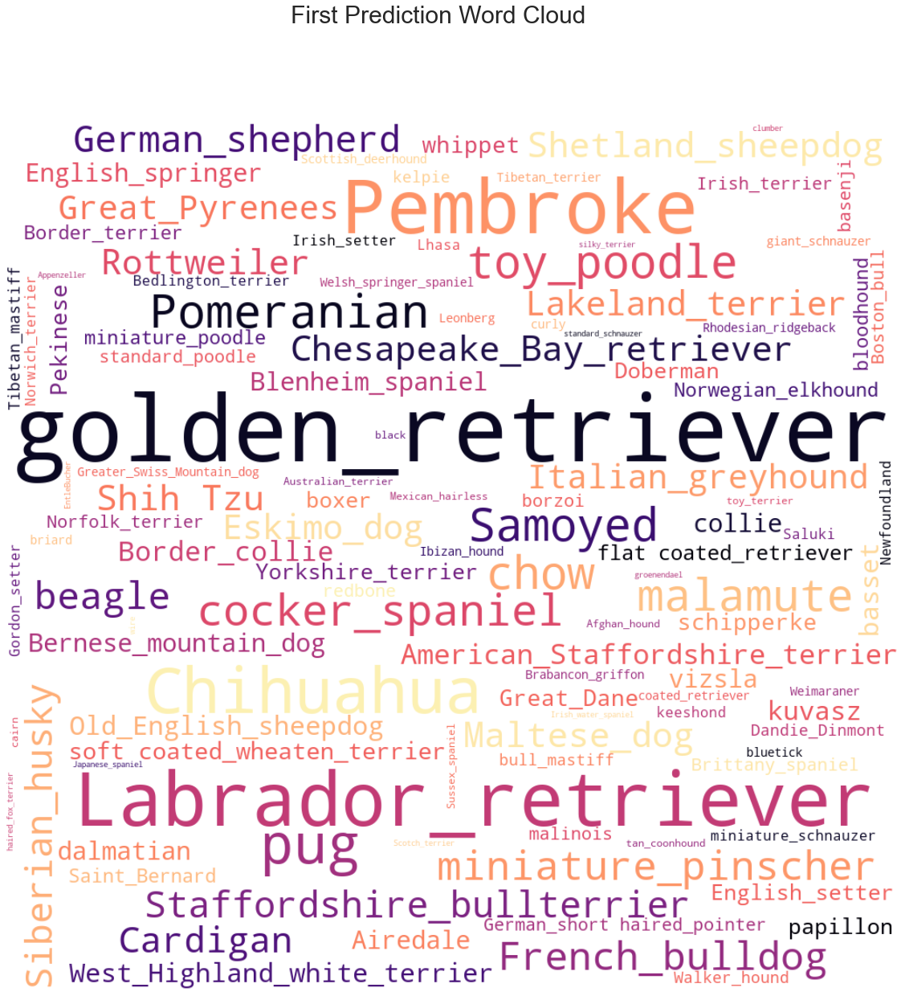

In [101]:
# call func to plot wordcloud for  first prediction 
draw_word_cloud(text_pred1, title_pred1)